In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 10.4 MB/s eta 0:00:00


In [ ]:
import torch
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")

True
NVIDIA RTX PRO 6000 Blackwell Server Edition


In [ ]:

from ultralytics import YOLO
from google.colab import drive

drive.mount('/content/drive')

DATA_YAML = "/content/drive/MyDrive/Yaml/Data.yaml"
PROJECT_DIR = "/content/drive/MyDrive/YOLO_Results"

model = YOLO("yolo26n.pt")

model.train(
    data=DATA_YAML,
    epochs=15,
    imgsz=640,
    batch=4,
    project=PROJECT_DIR,
    name="yolo11n_test_run",
    exist_ok=True
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Mounted at /content/drive
Ultralytics 8.4.43 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Server Edition, 97250MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/Yaml/Data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=15, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fractio

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7baed1451670>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

In [ ]:
from ultralytics import YOLO

BEST_MODEL = "/content/drive/MyDrive/YOLO_Results/yolo11n_test_run/weights/best.pt"
DATA_YAML = "/content/drive/MyDrive/Yaml/Data.yaml"

model = YOLO(BEST_MODEL)

metrics = model.val(
    data=DATA_YAML,
    split="test",
    imgsz=640
)

print(metrics.results_dict)

Ultralytics 8.4.43 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Server Edition, 97250MiB)
YOLO26n summary (fused): 122 layers, 2,375,421 parameters, 0 gradients, 5.2 GFLOPs
val: Fast image access ✅ (ping: 0.1±0.0 ms, read: 1.4±0.1 MB/s, size: 721.8 KB)
val: Scanning /content/drive/MyDrive/Dataset/labels/test.cache... 2584 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2584/2584 1.2Git/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 162/162 1.6it/s 1:42
                   all       2584     172952      0.961      0.471      0.489      0.343
                   car       2584     172939      0.922      0.943      0.978      0.686
                 truck         13         13          1          0          0          0
Speed: 0.1ms preprocess, 0.3ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to /content/runs/detect/val
{'metrics/precision(B)': 0.9610454709366063, 'metri

In [ ]:
from ultralytics import YOLO

BEST_MODEL = "/content/drive/MyDrive/YOLO_Results/yolo11n_test_run/weights/best.pt"
SOURCE = "/content/drive/MyDrive/Dataset/images/test"
RESULTS_DIR = "/content/drive/MyDrive/YOLO_Final_Predictions"

model = YOLO(BEST_MODEL)

count = 0
for r in model.predict(
    source=SOURCE,
    imgsz=640,
    conf=0.25,
    save=True,
    project=RESULTS_DIR,
    name="predict_finetuned",
    exist_ok=True,
    stream=True,
    verbose=False
):
    count += 1

print("Done")
print("Images processed:", count)
print("Saved to:", f"{RESULTS_DIR}/predict_finetuned")

Results saved to /content/drive/MyDrive/YOLO_Final_Predictions/predict_finetuned
Done
Images processed: 2584
Saved to: /content/drive/MyDrive/YOLO_Final_Predictions/predict_finetuned


Images found: 2584


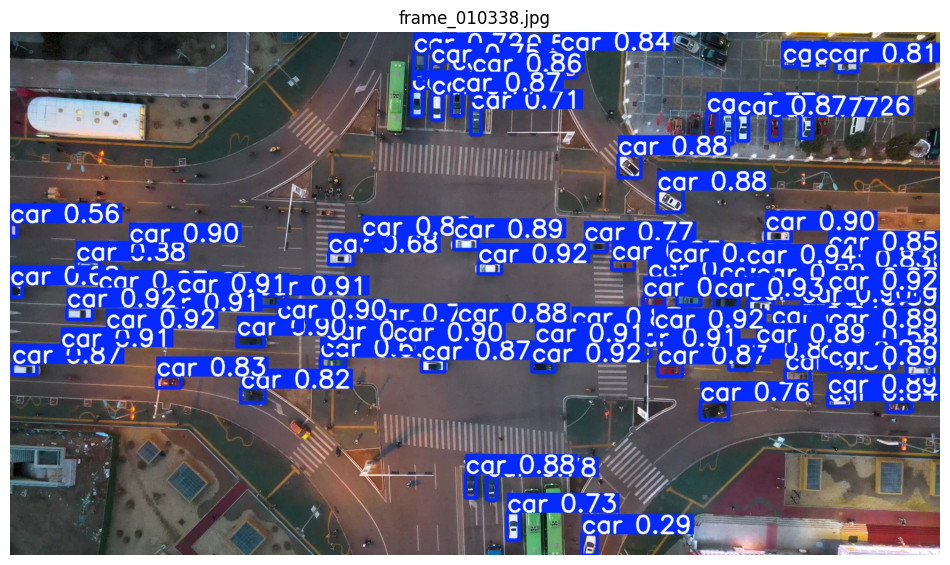

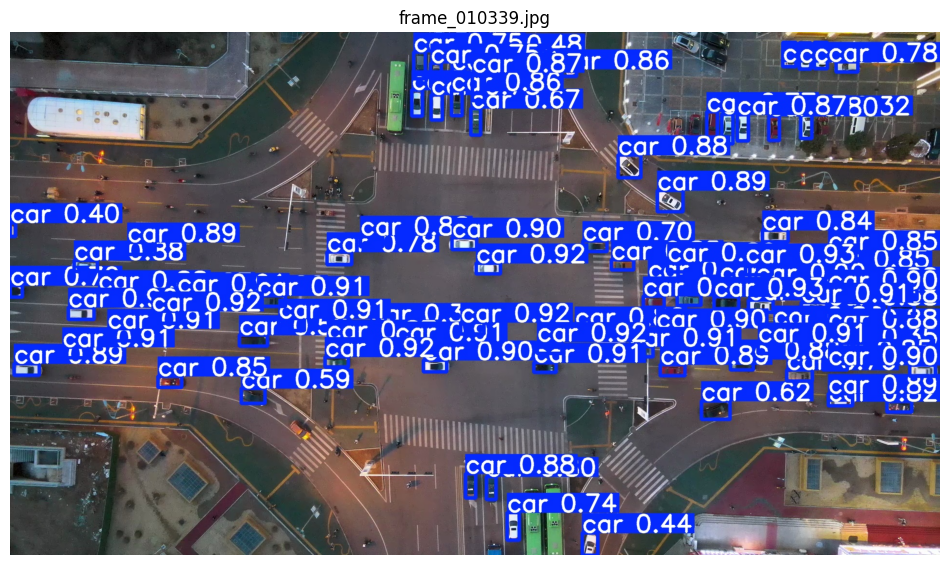

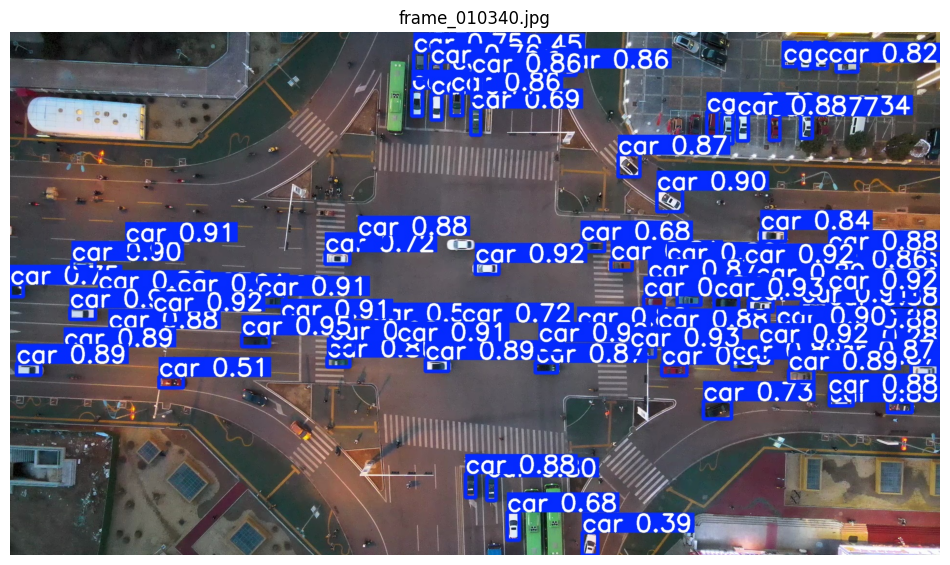

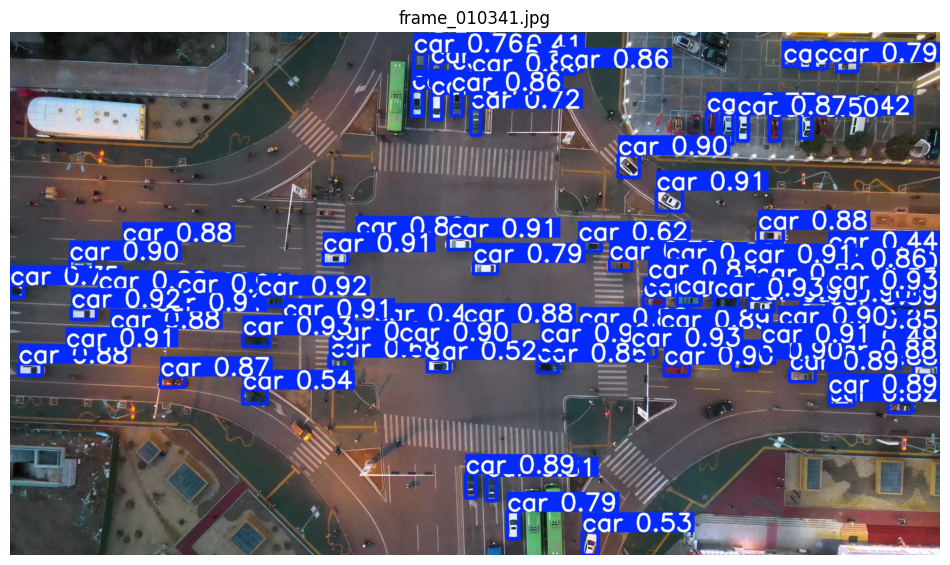

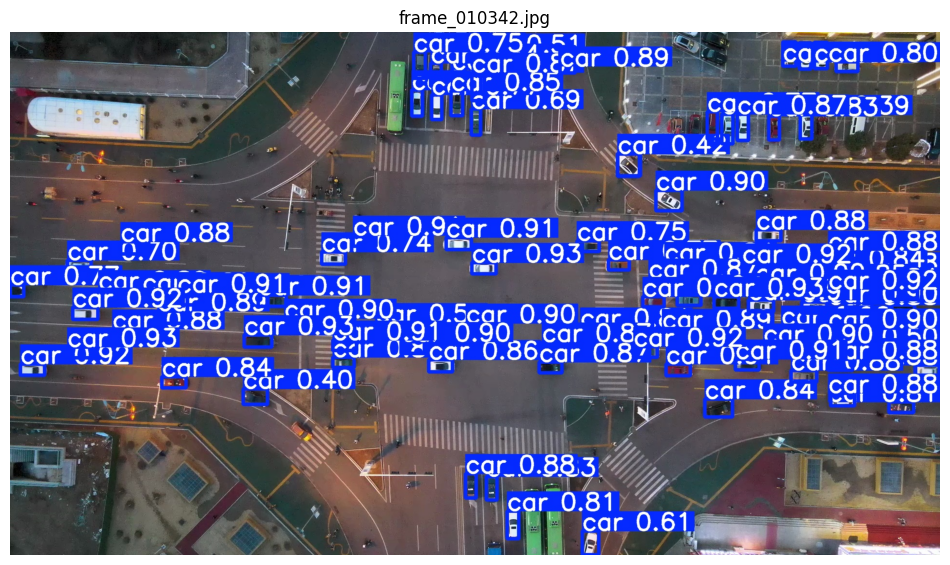

In [ ]:
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

predict_dir = Path("/content/drive/MyDrive/YOLO_Final_Predictions/predict_finetuned")

image_files = sorted(list(predict_dir.glob("*.jpg")) + list(predict_dir.glob("*.jpeg")) + list(predict_dir.glob("*.png")))

print("Images found:", len(image_files))

for img_path in image_files[:5]:
    img = Image.open(img_path)
    plt.figure(figsize=(12, 8))
    plt.imshow(img)
    plt.title(img_path.name)
    plt.axis("off")
    plt.show()

In [ ]:
!pip install sahi ultralytics

In [3]:
from pathlib import Path
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction

MODEL_PATH = "/content/drive/MyDrive/YOLO_Results/yolo11n_test_run/weights/best.pt"
SOURCE_DIR = Path("/content/drive/MyDrive/Dataset/images/test")
OUTPUT_DIR = Path("/content/drive/MyDrive/YOLO_SAHI_Sample")

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

image_files = sorted(
    list(SOURCE_DIR.glob("*.jpg")) +
    list(SOURCE_DIR.glob("*.jpeg")) +
    list(SOURCE_DIR.glob("*.png"))
)[:20]

detection_model = AutoDetectionModel.from_pretrained(
    model_type="ultralytics",
    model_path=MODEL_PATH,
    confidence_threshold=0.25,
    device="cuda:0"
)

for image_path in image_files:
    result = get_sliced_prediction(
        str(image_path),
        detection_model,
        slice_height=640,
        slice_width=640,
        overlap_height_ratio=0.2,
        overlap_width_ratio=0.2
    )

    result.export_visuals(
        export_dir=str(OUTPUT_DIR),
        file_name=image_path.stem,
        hide_labels=False,
        hide_conf=False
    )

print("Done")
print("Saved to:", OUTPUT_DIR)

Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Done
Saved to: /content/drive/MyDrive/YOLO_SAHI_Sample


Files found: 20


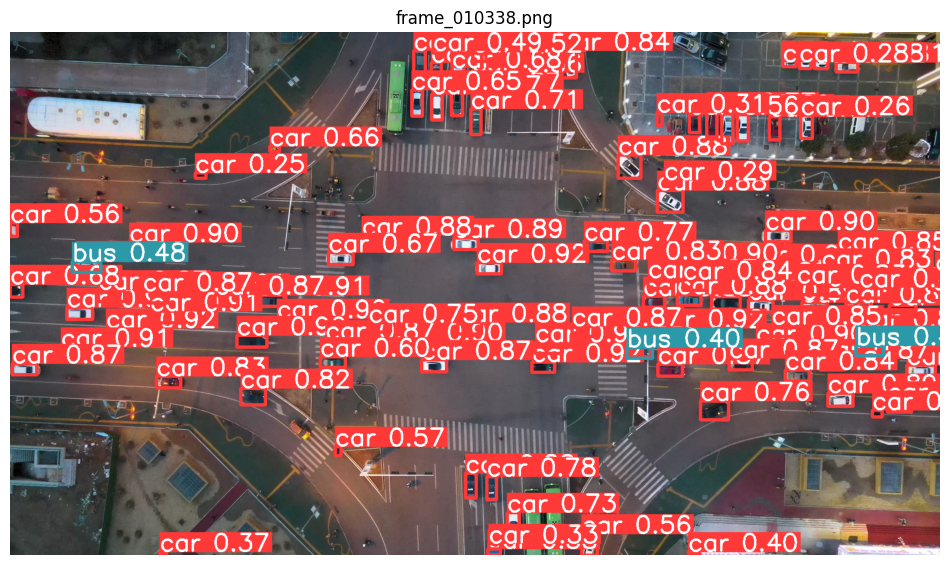

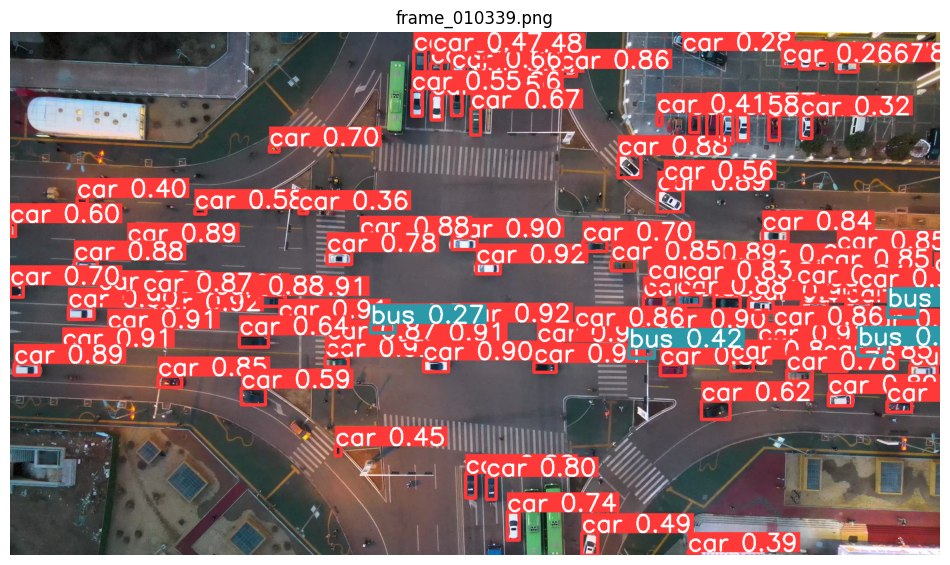

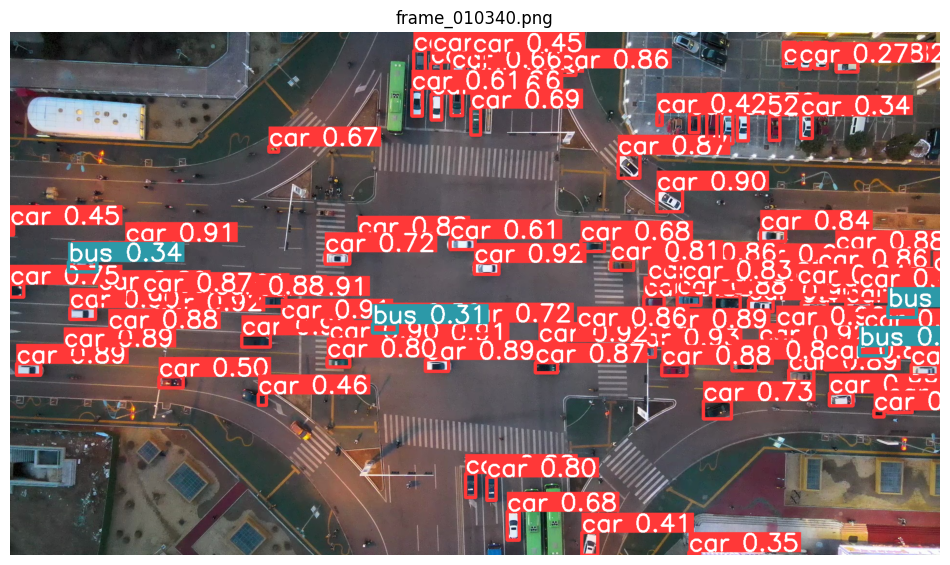

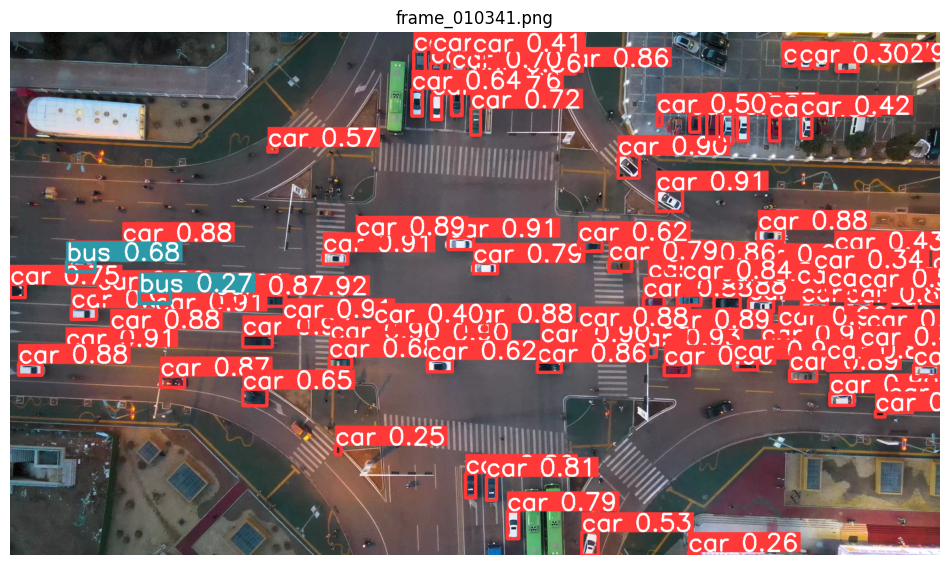

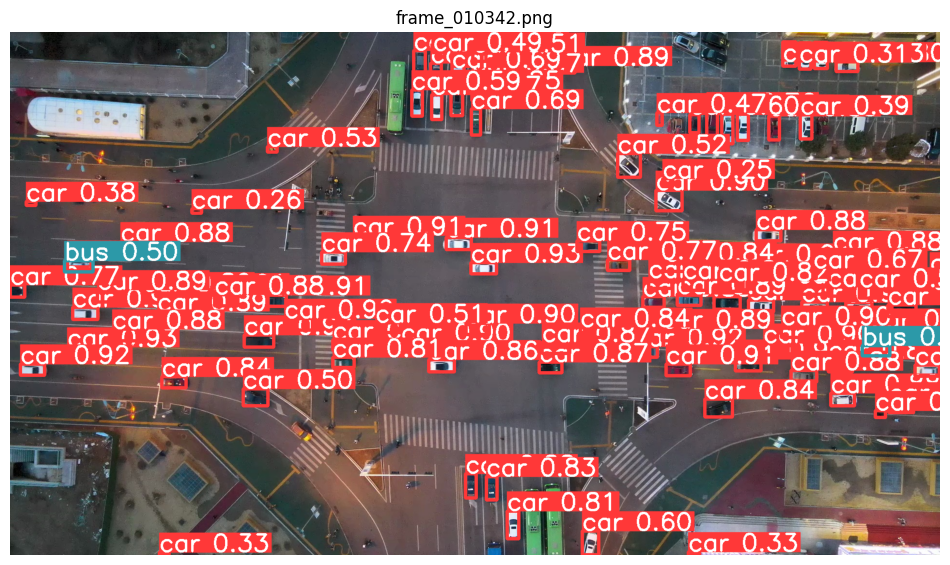

In [4]:
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

OUTPUT_DIR = Path("/content/drive/MyDrive/YOLO_SAHI_Sample")

result_files = sorted(
    list(OUTPUT_DIR.glob("*.png")) +
    list(OUTPUT_DIR.glob("*.jpg")) +
    list(OUTPUT_DIR.glob("*.jpeg"))
)

print("Files found:", len(result_files))

for img_path in result_files[:5]:
    img = Image.open(img_path)
    plt.figure(figsize=(12, 8))
    plt.imshow(img)
    plt.title(img_path.name)
    plt.axis("off")
    plt.show()

In [5]:
!pip install -q ultralytics sahi torchmetrics pandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 37.6 MB/s eta 0:00:00


In [ ]:
from pathlib import Path
import torch
import pandas as pd

from ultralytics import YOLO
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# =========================
# PATHS
# =========================
MODEL_PATH = "/content/drive/MyDrive/YOLO_Results/yolo11n_test_run/weights/best.pt"
IMAGES_DIR = Path("/content/drive/MyDrive/Dataset/images/test")
LABELS_DIR = Path("/content/drive/MyDrive/Dataset/labels/test")

MAX_IMAGES = 100   # поставь None, если хочешь весь test

# =========================
# CLASS MAP
# =========================
CLASS_NAMES = {
    0: "bus",
    1: "car",
    2: "truck"
}

# =========================
# HELPERS
# =========================
def yolo_to_xyxy(x_center, y_center, width, height, img_w, img_h):
    x_center *= img_w
    y_center *= img_h
    width *= img_w
    height *= img_h

    x1 = x_center - width / 2
    y1 = y_center - height / 2
    x2 = x_center + width / 2
    y2 = y_center + height / 2
    return [x1, y1, x2, y2]

def load_target(label_path, img_w, img_h):
    boxes = []
    labels = []

    if not label_path.exists():
        return {
            "boxes": torch.zeros((0, 4), dtype=torch.float32),
            "labels": torch.zeros((0,), dtype=torch.int64),
        }

    with open(label_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        parts = line.strip().split()
        if len(parts) != 5:
            continue

        cls_id = int(parts[0])
        x_center, y_center, width, height = map(float, parts[1:])
        box = yolo_to_xyxy(x_center, y_center, width, height, img_w, img_h)

        boxes.append(box)
        labels.append(cls_id)

    if len(boxes) == 0:
        return {
            "boxes": torch.zeros((0, 4), dtype=torch.float32),
            "labels": torch.zeros((0,), dtype=torch.int64),
        }

    return {
        "boxes": torch.tensor(boxes, dtype=torch.float32),
        "labels": torch.tensor(labels, dtype=torch.int64),
    }

def predict_finetuned(model, image_path):
    results = model.predict(
        source=str(image_path),
        imgsz=640,
        conf=0.25,
        verbose=False
    )

    r = results[0]

    if r.boxes is None or len(r.boxes) == 0:
        return {
            "boxes": torch.zeros((0, 4), dtype=torch.float32),
            "scores": torch.zeros((0,), dtype=torch.float32),
            "labels": torch.zeros((0,), dtype=torch.int64),
        }

    boxes = r.boxes.xyxy.cpu().to(torch.float32)
    scores = r.boxes.conf.cpu().to(torch.float32)
    labels = r.boxes.cls.cpu().to(torch.int64)

    return {
        "boxes": boxes,
        "scores": scores,
        "labels": labels,
    }

def predict_sahi(detection_model, image_path):
    result = get_sliced_prediction(
        str(image_path),
        detection_model,
        slice_height=640,
        slice_width=640,
        overlap_height_ratio=0.2,
        overlap_width_ratio=0.2
    )

    boxes = []
    scores = []
    labels = []

    for obj in result.object_prediction_list:
        bbox = obj.bbox
        score = obj.score.value
        cls_id = int(obj.category.id)

        boxes.append([bbox.minx, bbox.miny, bbox.maxx, bbox.maxy])
        scores.append(score)
        labels.append(cls_id)

    if len(boxes) == 0:
        return {
            "boxes": torch.zeros((0, 4), dtype=torch.float32),
            "scores": torch.zeros((0,), dtype=torch.float32),
            "labels": torch.zeros((0,), dtype=torch.int64),
        }

    return {
        "boxes": torch.tensor(boxes, dtype=torch.float32),
        "scores": torch.tensor(scores, dtype=torch.float32),
        "labels": torch.tensor(labels, dtype=torch.int64),
    }

def evaluate_model(image_files, target_loader, pred_loader):
    metric = MeanAveragePrecision(class_metrics=True)

    for image_path in image_files:
        from PIL import Image
        img = Image.open(image_path)
        img_w, img_h = img.size

        label_path = LABELS_DIR / f"{image_path.stem}.txt"
        target = target_loader(label_path, img_w, img_h)
        pred = pred_loader(image_path)

        metric.update([pred], [target])

    return metric.compute()

def safe_item(x):
    if hasattr(x, "item"):
        return float(x.item())
    return float(x)

# =========================
# LOAD MODELS
# =========================
finetuned_model = YOLO(MODEL_PATH)

sahi_model = AutoDetectionModel.from_pretrained(
    model_type="ultralytics",
    model_path=MODEL_PATH,
    confidence_threshold=0.25,
    device="cuda:0" if torch.cuda.is_available() else "cpu"
)

# =========================
# GET TEST IMAGES
# =========================
image_files = sorted(
    list(IMAGES_DIR.glob("*.jpg")) +
    list(IMAGES_DIR.glob("*.jpeg")) +
    list(IMAGES_DIR.glob("*.png"))
)

if MAX_IMAGES is not None:
    image_files = image_files[:MAX_IMAGES]

print("Images used for evaluation:", len(image_files))

# =========================
# EVALUATE FINE-TUNED
# =========================
finetuned_metrics = evaluate_model(
    image_files=image_files,
    target_loader=load_target,
    pred_loader=lambda image_path: predict_finetuned(finetuned_model, image_path)
)

# =========================
# EVALUATE FINE-TUNED + SAHI
# =========================
sahi_metrics = evaluate_model(
    image_files=image_files,
    target_loader=load_target,
    pred_loader=lambda image_path: predict_sahi(sahi_model, image_path)
)

# =========================
# SUMMARY TABLE
# =========================
comparison = pd.DataFrame([
    {
        "Model": "Fine-tuned YOLO",
        "mAP50-95": safe_item(finetuned_metrics["map"]),
        "mAP50": safe_item(finetuned_metrics["map_50"]),
        "Precision": safe_item(finetuned_metrics["mar_100"]),  
        "Recall": safe_item(finetuned_metrics["mar_100"]),
    },
    {
        "Model": "Fine-tuned YOLO + SAHI",
        "mAP50-95": safe_item(sahi_metrics["map"]),
        "mAP50": safe_item(sahi_metrics["map_50"]),
        "Precision": safe_item(sahi_metrics["mar_100"]),
        "Recall": safe_item(sahi_metrics["mar_100"]),
    },
])

print(comparison)

Images used for evaluation: 100
Performing prediction on 8 slices.
Performing prediction on 8 slices.


/usr/local/lib/python3.12/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)


Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing prediction on 8 slices.
Performing predictio